In [1]:
import pathlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

In [2]:
from scipy import stats
import statsmodels.api as sm
import statsmodels

In [3]:
import pickle

In [4]:
import autoreload
import evotsc_plot
autoreload.reload(evotsc_plot)

<module 'evotsc_plot' from '/Users/theotime/Work/Code/EvoTSC/evotsc_plot.py'>

In [5]:
nb_genes_type = 20

In [6]:
label_fontsize=20
tick_fontsize=15
legend_fontsize=15

In [7]:
#exp_path = '/Users/theotime/Desktop/evotsc/beta_higher/'
exp_path = '/Users/theotime/Desktop/evotsc/alife_replay/'

In [8]:
def get_stats(exp_name):
    
    exp_name = pathlib.Path(exp_name)
        
    rep_dirs = sorted([d for d in exp_name.iterdir() if (d.is_dir() and d.name.startswith("rep"))])
    
    res = pd.DataFrame()
    
    for i_rep, rep_dir in enumerate(rep_dirs):
                
        res_dir = pd.read_csv(rep_dir.joinpath('stats.csv'))
        
        res_dir.insert(0, 'Replicate', i_rep)
        
        res = pd.concat([res, res_dir])
    
    return res

In [9]:
def plot_gene_activity(base_path):
    
    base_path = pathlib.Path(base_path)
    
    nb_rep = 0
    for item in sorted(base_path.iterdir()):
        if item.is_dir():
            nb_rep += 1
    
    for rep in range(nb_rep):
        stats_path = base_path.joinpath(f'rep{rep:02}/stats.csv')
        if stats_path.stat().st_size > 0: # not an empty file

            data = pd.read_csv(stats_path)
            data = data[data['Gen'] > 0]

            for env in ["A", "B"]:

                fig, ax1 = plt.subplots(figsize=(9, 4), dpi=300)
                ax1.set_ylim(-0.05, 1.05)
                ax1.set_ylabel('Proportion of activated genes', fontsize=label_fontsize)
                ax1.set_xlabel('Generation', fontsize=label_fontsize)
                ax1.set_xscale('log')
                ax1.grid()

                ax1.plot(data['Gen'], data[f"ABon_{env}"] / (data[f"ABon_{env}"] + data[f"ABoff_{env}"]),
                         color="tab:blue",
                         linewidth=2,
                         label="AB genes")
                ax1.plot(data['Gen'], data[f"Aon_{env}"] / (data[f"Aon_{env}"] + data[f"Aoff_{env}"]),
                         color="tab:red",
                         linewidth=2,
                         label="A genes")
                ax1.plot(data['Gen'], data[f"Bon_{env}"] / (data[f"Bon_{env}"] + data[f"Boff_{env}"]),
                         color="tab:green",
                         linewidth=2,
                         label="B genes")

                #ax1.legend()
                plt.tick_params(axis='both', which='major', labelsize=tick_fontsize)

                ax2 = ax1.twinx()
                ax2.set_yscale('log')
                ax2.set_ylim(1e-97, 1e-3)
                ax2.set_ylabel('Fitness', fontsize=label_fontsize)
                ax2.plot(data['Gen'],
                         data["Fitness"],
                         color="tab:cyan",
                         linewidth=2,
                         label="Fitness")

                plt.tick_params(axis='both', which='major', labelsize=tick_fontsize)

                
                #plt.title(f"Environment {env}")
                fig.legend(bbox_to_anchor=(0,0),
                           bbox_transform=ax1.transAxes,
                           loc="lower left",
                           fontsize=legend_fontsize)            

                plt.savefig(f'{base_path}/rep_{rep:02}_env_{env}', dpi=300, bbox_inches='tight')
                
                plt.close()


In [10]:
plot_gene_activity(exp_path)

In [11]:
full_stats = get_stats(exp_path)

In [12]:
def compute_error(count, mean, nobs, alpha, method):
    lower, upper = sm.stats.proportion_confint(count, nobs, alpha, method)
    return (mean - lower, upper - mean)

In [13]:
def plot_mean_std(full_stats):
    last_gen = np.max(full_stats['Gen'])
    last_gen_stats = full_stats[full_stats["Gen"] == last_gen] / nb_genes_type
    mean_stats = last_gen_stats.mean()
    std_stats = last_gen_stats.std()
    fig, ax = plt.subplots(figsize=(9, 4), dpi=300)

    x = np.arange(3)  # 3 types of genes
    width = 0.35  # the width of the bars

    env_A_means = np.array([mean_stats["ABon_A"], mean_stats["Aon_A"], mean_stats["Bon_A"]])
    env_B_means = np.array([mean_stats["ABon_B"], mean_stats["Aon_B"], mean_stats["Bon_B"]])

    # Compute error bars with a binomial proportion confidence interval
    # https://www.statsmodels.org/stable/generated/statsmodels.stats.proportion.proportion_confint.html
    alpha = 0.05
    ABon_A_err = compute_error(count=np.sum(last_gen_stats["ABon_A"]),
                               mean=mean_stats["ABon_A"],
                               nobs=np.sum(last_gen_stats["ABon_A"] + last_gen_stats["ABoff_A"]),
                               alpha=alpha, method='wilson')
    Aon_A_err = compute_error(count=np.sum(last_gen_stats["Aon_A"]),
                              mean=mean_stats["Aon_A"],
                              nobs=np.sum(last_gen_stats["Aon_A"] + last_gen_stats["Aoff_A"]),
                              alpha=alpha, method='wilson')
    Bon_A_err = compute_error(count=np.sum(last_gen_stats["Bon_A"]),
                              mean=mean_stats["Bon_A"],
                              nobs=np.sum(last_gen_stats["Bon_A"] + last_gen_stats["Boff_A"]),
                              alpha=alpha, method='wilson')
    env_A_err = np.transpose(np.array([ABon_A_err, Aon_A_err, Bon_A_err]))

    
    ABon_B_err = compute_error(count=np.sum(last_gen_stats["ABon_B"]),
                               mean=mean_stats["ABon_B"],
                               nobs=np.sum(last_gen_stats["ABon_B"] + last_gen_stats["ABoff_B"]),
                               alpha=alpha, method='wilson')
    Aon_B_err = compute_error(count=np.sum(last_gen_stats["Aon_B"]),
                              mean=mean_stats["Aon_B"],
                              nobs=np.sum(last_gen_stats["Aon_B"] + last_gen_stats["Aoff_B"]),
                              alpha=alpha, method='wilson')
    Bon_B_err = compute_error(count=np.sum(last_gen_stats["Bon_B"]),
                              mean=mean_stats["Bon_B"],
                              nobs=np.sum(last_gen_stats["Bon_B"] + last_gen_stats["Boff_B"]),
                              alpha=alpha, method='wilson')
    env_B_err = np.transpose(np.array([ABon_B_err, Aon_B_err, Bon_B_err]))
    
    
    rects_A = ax.bar(x - width/2,
                    env_A_means,
                    width=width,
                    label='Environment A',
                    #yerr=[np.zeros_like(env_A_std), env_A_std],
                    yerr=env_A_err,
                    capsize=5)

    rects_B = ax.bar(x + width/2,
                     env_B_means,
                     width=width,
                     label='Environment B',
                     yerr=env_B_err,
                     capsize=5)

    ax.set_ylabel('Activated genes', fontsize=label_fontsize)
    ax.set_xticks(x)
    ax.set_xticklabels(["AB genes on", "A genes on", "B genes on"])

    plt.grid(linestyle=':', axis='y')

    plt.tick_params(axis='both', which='major', labelsize=tick_fontsize)

    plt.legend(fontsize=legend_fontsize, loc='upper left', bbox_to_anchor=(0.46, 1))

    plt.savefig(f'{exp_path}/mean_activation', bbox_inches='tight')


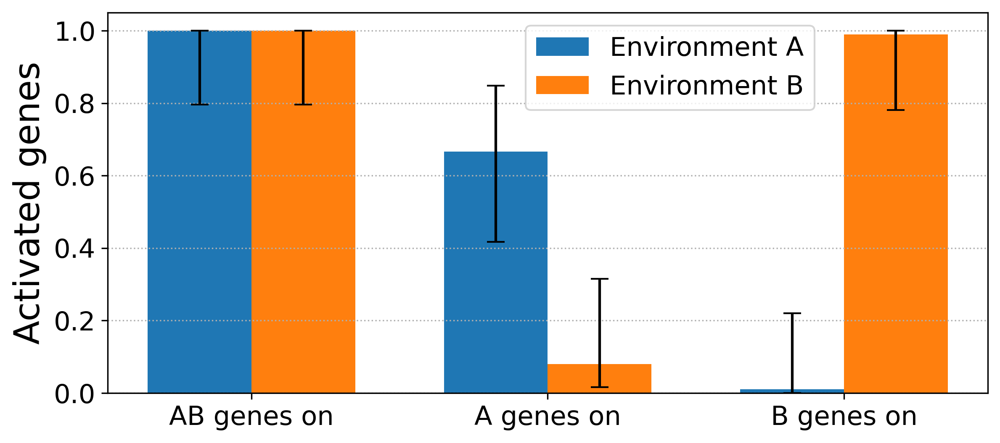

In [14]:
plot_mean_std(full_stats)

In [15]:
def test_stats(full_stats):
    last_gen = np.max(full_stats['Gen'])
    last_gen_stats = full_stats[full_stats["Gen"] == last_gen] / nb_genes_type
    
    print(stats.ttest_rel(last_gen_stats["ABon_A"], last_gen_stats["ABon_B"]))
    print(stats.ttest_rel(last_gen_stats["Aon_A"], last_gen_stats["Aon_B"]))
    print(stats.ttest_rel(last_gen_stats["Bon_A"], last_gen_stats["Bon_B"]))
    
    diff_A = statsmodels.stats.weightstats.CompareMeans(d1=statsmodels.stats.weightstats.DescrStatsW(last_gen_stats["Aon_A"]),
                                                        d2=statsmodels.stats.weightstats.DescrStatsW(last_gen_stats["Aon_B"]))
    
    diff_B = statsmodels.stats.weightstats.CompareMeans(d1=statsmodels.stats.weightstats.DescrStatsW(last_gen_stats["Bon_A"]),
                                                        d2=statsmodels.stats.weightstats.DescrStatsW(last_gen_stats["Bon_B"]))
    
    print(f'Diff A Z-test: {diff_A.ztest_ind(usevar="unequal")}')
    print(f'Diff A T-test: {diff_A.ttest_ind(usevar="unequal")}')
    print(f'Diff B Z-test: {diff_B.ztest_ind(usevar="unequal")}')
    print(f'Diff B Z-test: {diff_B.ttest_ind(usevar="unequal")}')

In [16]:
test_stats(full_stats)

Ttest_relResult(statistic=nan, pvalue=nan)
Ttest_relResult(statistic=39.07666714924595, pvalue=1.074400422563416e-15)
Ttest_relResult(statistic=-91.67060597596152, pvalue=7.380027235568313e-21)
Diff A Z-test: (19.909851676601654, 3.3430323869016676e-88)
Diff A T-test: (19.909851676601654, 4.632886432778684e-18, 27.984193895343008)
Diff B Z-test: (-108.9209103243374, 0.0)
Diff B Z-test: (-108.9209103243374, 7.337207110223159e-36, 25.770700636942692)


In [17]:
def plot_expr_AB(indiv, plot_title, plot_name):

    (temporal_expr_A, temporal_expr_B), fitness = indiv.evaluate()

    colors = ['tab:blue', 'tab:red', 'tab:green'] # AB: blue, A: red, B: green

    plt.figure(figsize=(9, 8), dpi=300)

    ## First subplot: environment A
    plt.subplot(2, 1, 1)
    plt.ylim(-0.1, 2.1)

    for gene in range(indiv.nb_genes):
        linestyle = 'solid' if indiv.genes[gene].orientation == 0 else 'dashed'
        plt.plot(temporal_expr_A[indiv.genes[gene].id, :],
                 linestyle=linestyle,
                 linewidth=2,
                 color=colors[indiv.genes[gene].gene_type],
                 #alpha=0.25,
                 label=f'Gene {indiv.genes[gene].id}')

    plt.grid(linestyle=':')
    #plt.xlabel('Time', fontsize='large')
    plt.ylabel('Expression level', fontsize=label_fontsize)

    plt.tick_params(axis='both', which='major', labelsize=tick_fontsize)

    #plt.legend(loc='center right')
    #plt.title('Environment A')

    ## Second subplot: environment B
    plt.subplot(2, 1, 2)
    plt.ylim(-0.1, 2.1)

    for gene in range(indiv.nb_genes):
        linestyle = 'solid' if indiv.genes[gene].orientation == 0 else 'dashed'
        plt.plot(temporal_expr_B[indiv.genes[gene].id, :],
                 linestyle=linestyle,
                 linewidth=2,
                 color=colors[indiv.genes[gene].gene_type],
                 #alpha=0.25,
                 label=f'Gene {indiv.genes[gene].id}')

    plt.grid(linestyle=':')
    plt.xlabel('Time', fontsize=label_fontsize)
    plt.ylabel('Expression level', fontsize=label_fontsize)

    plt.tick_params(axis='both', which='major', labelsize=tick_fontsize)

    #plt.legend(loc='center right')
    #plt.title('Environment B')

    ## Final stuff

    plt.tight_layout()


    plt.savefig(plot_name, dpi=300, bbox_inches='tight')


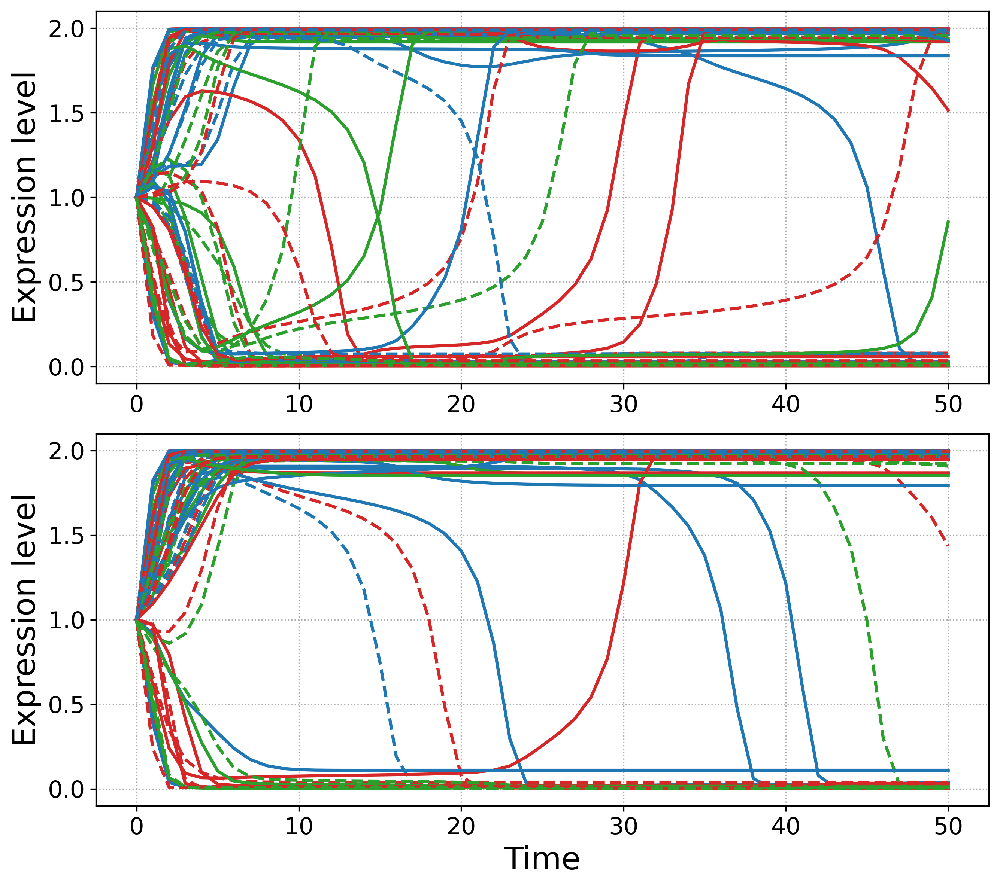

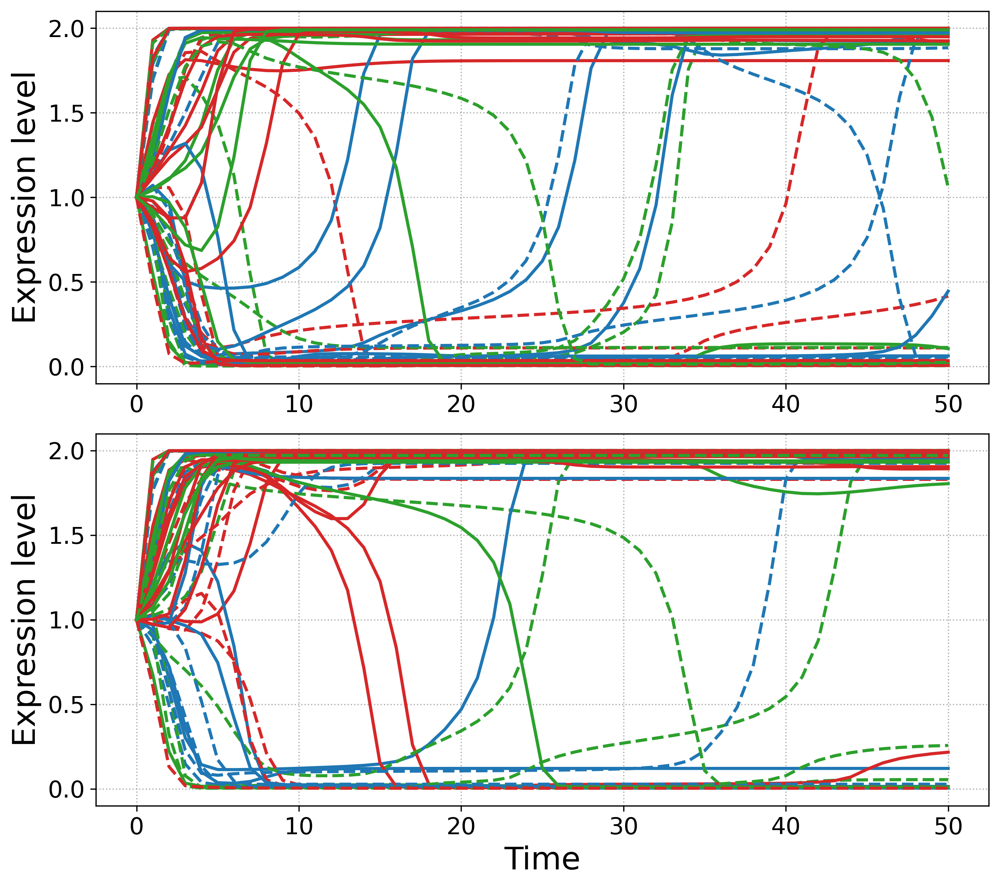

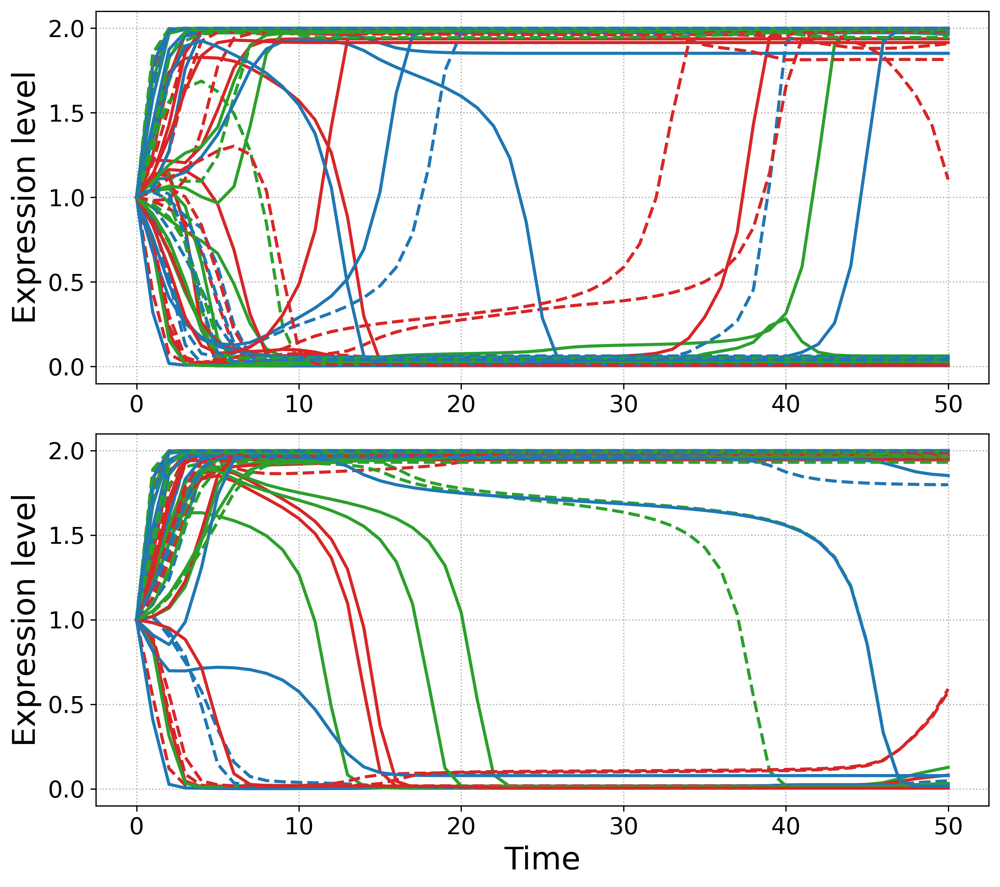

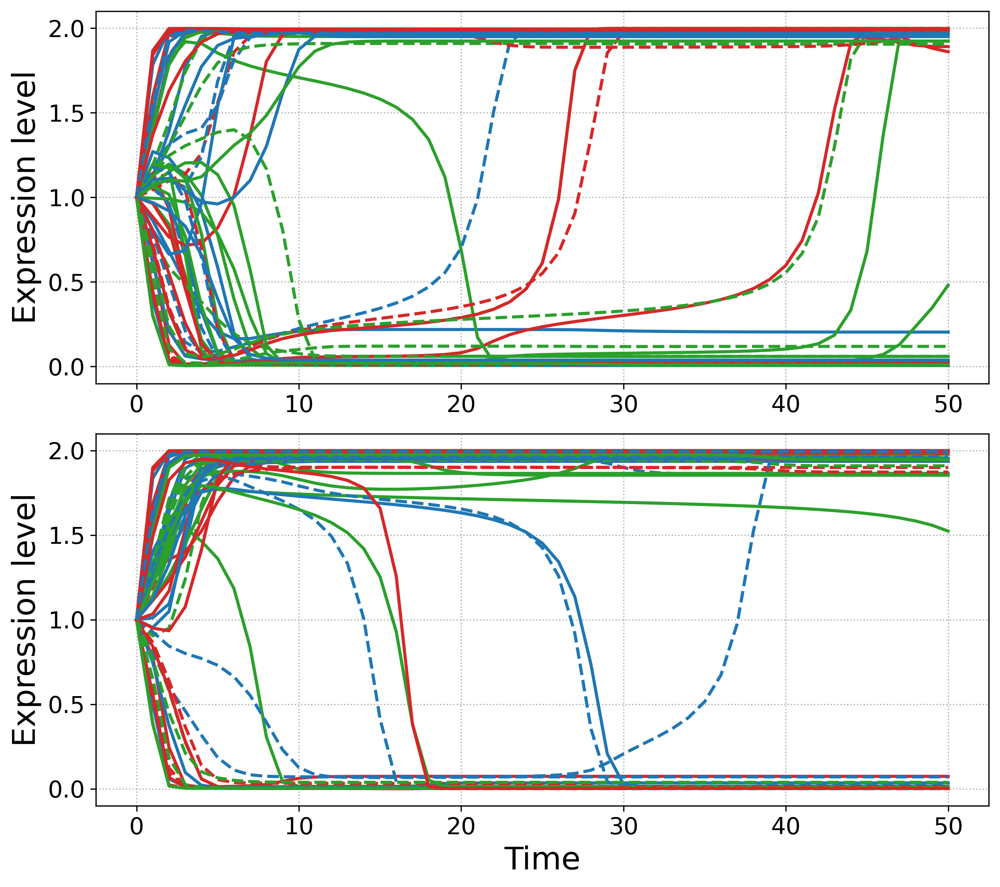

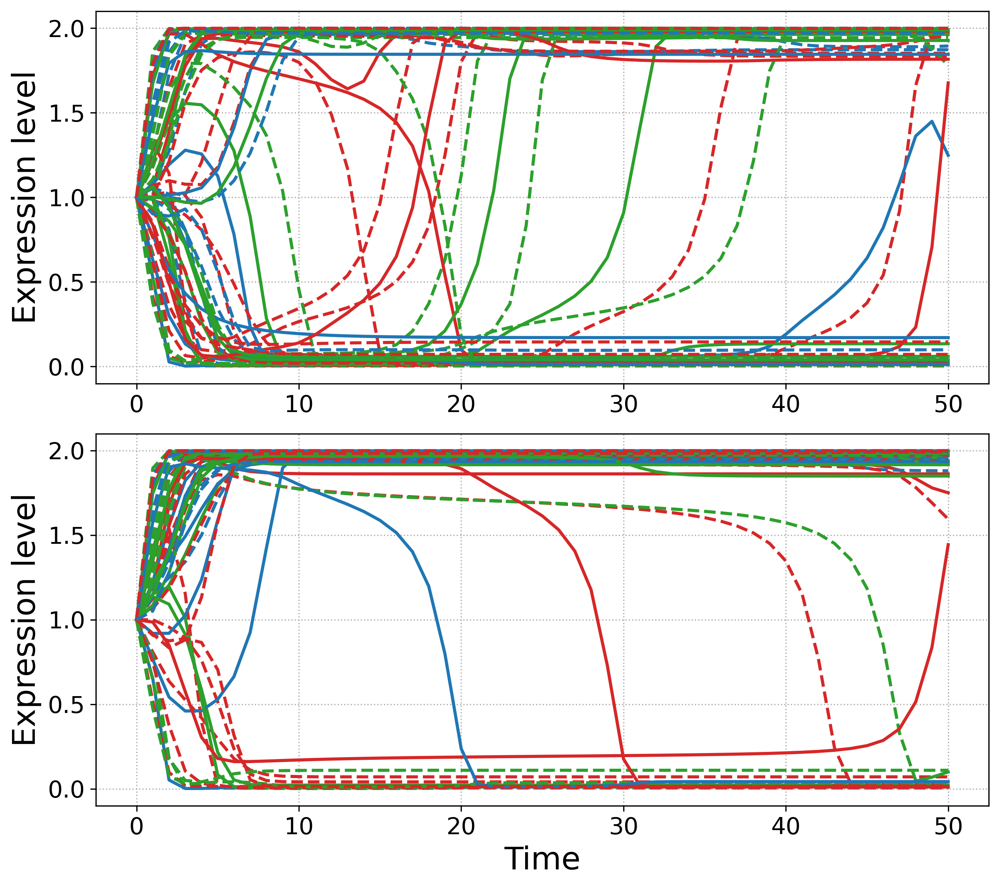

...

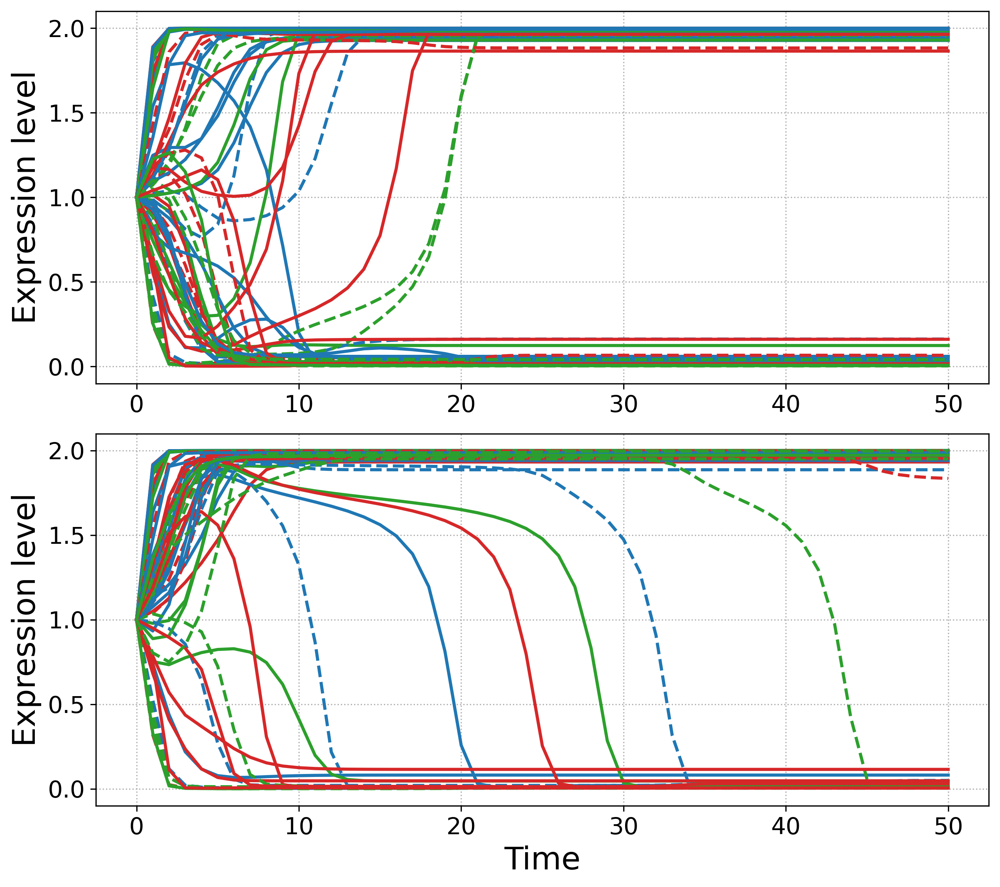

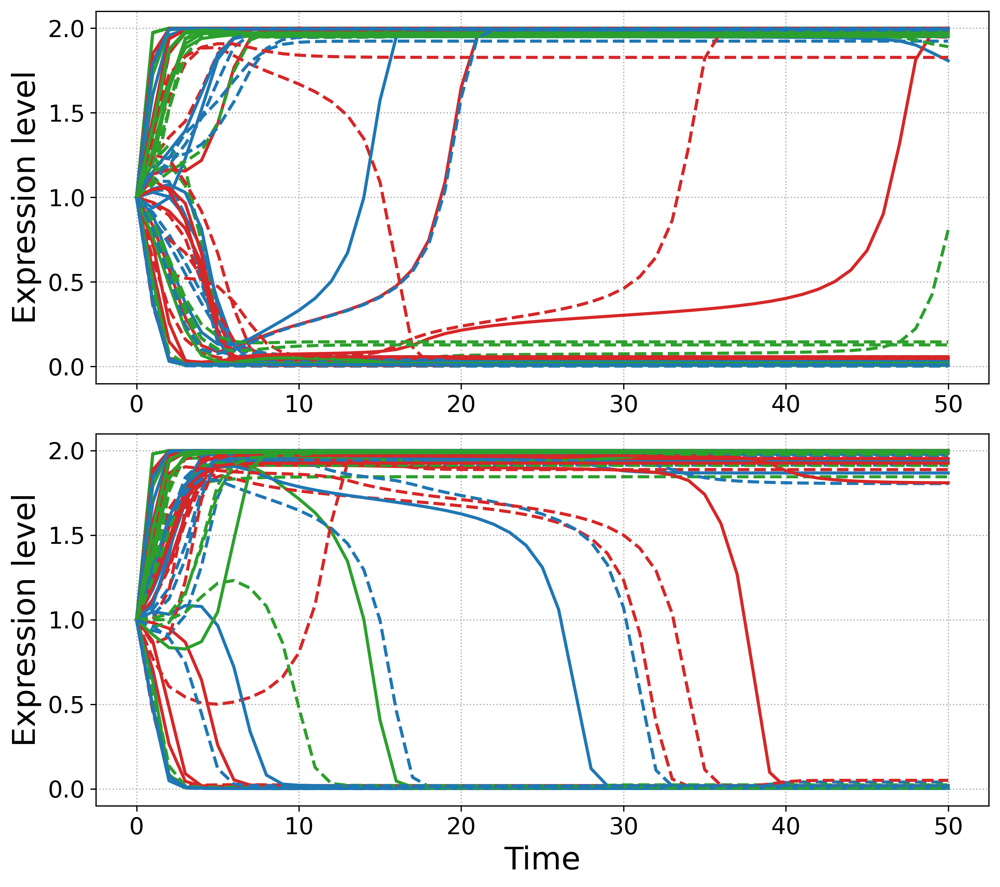

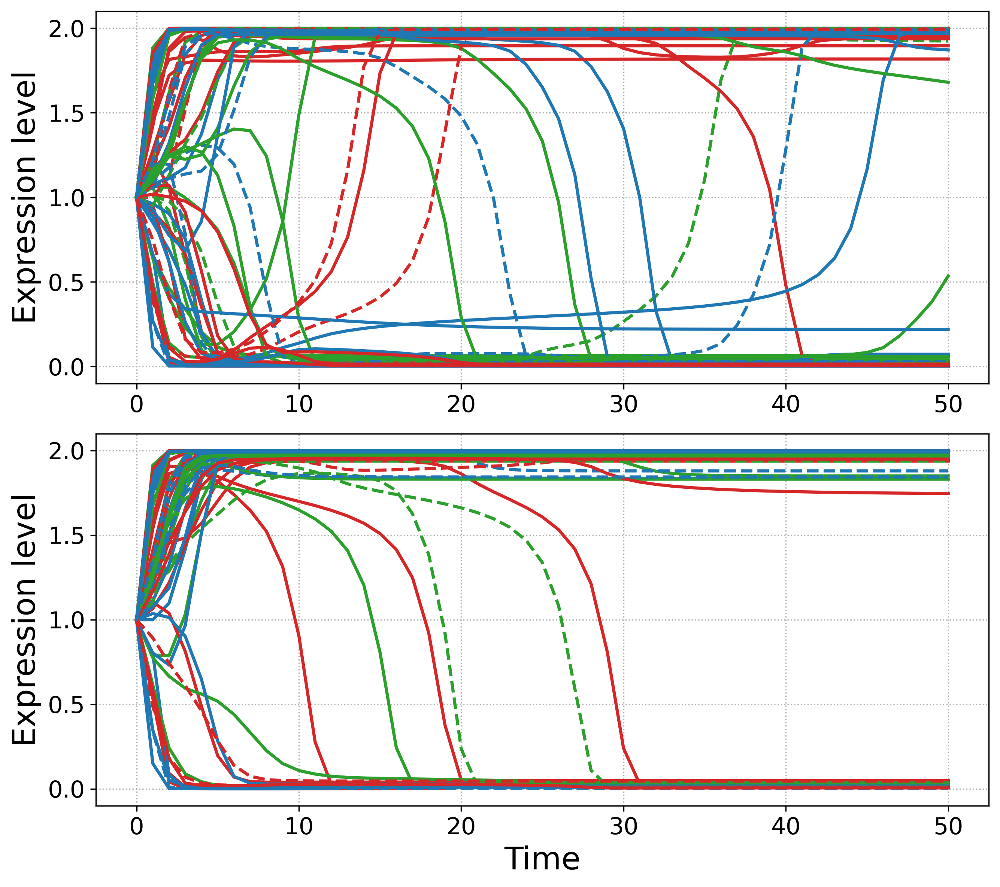

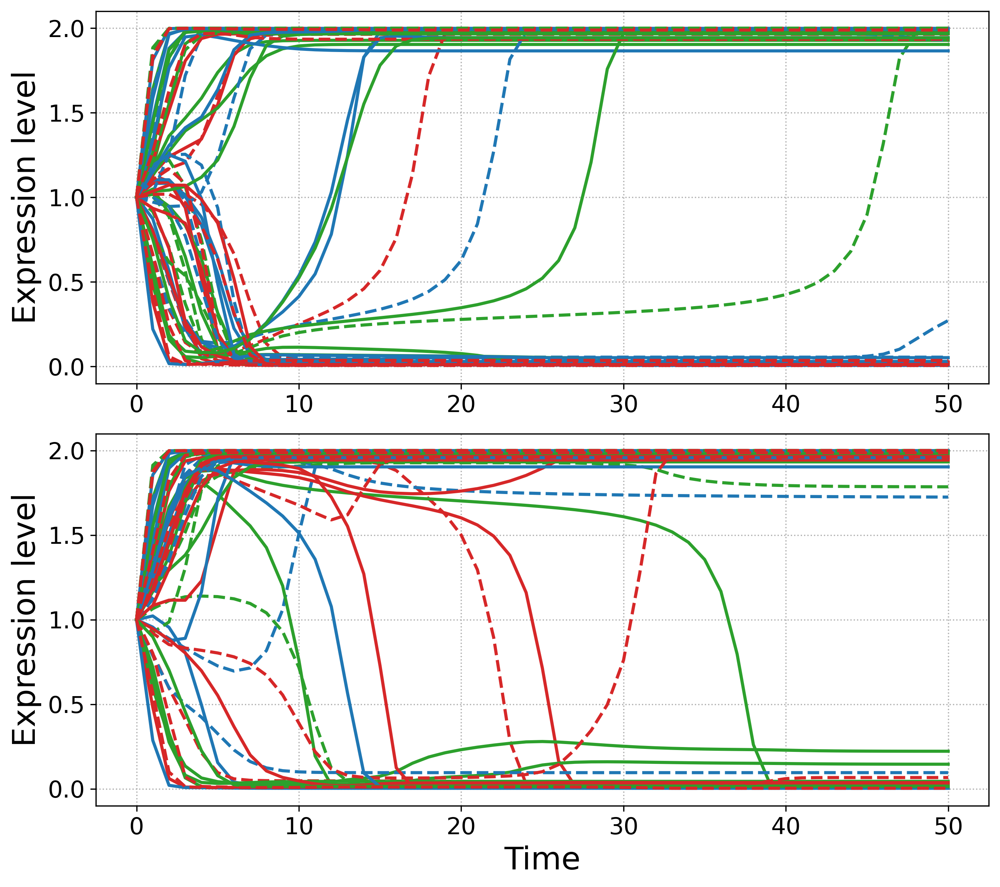

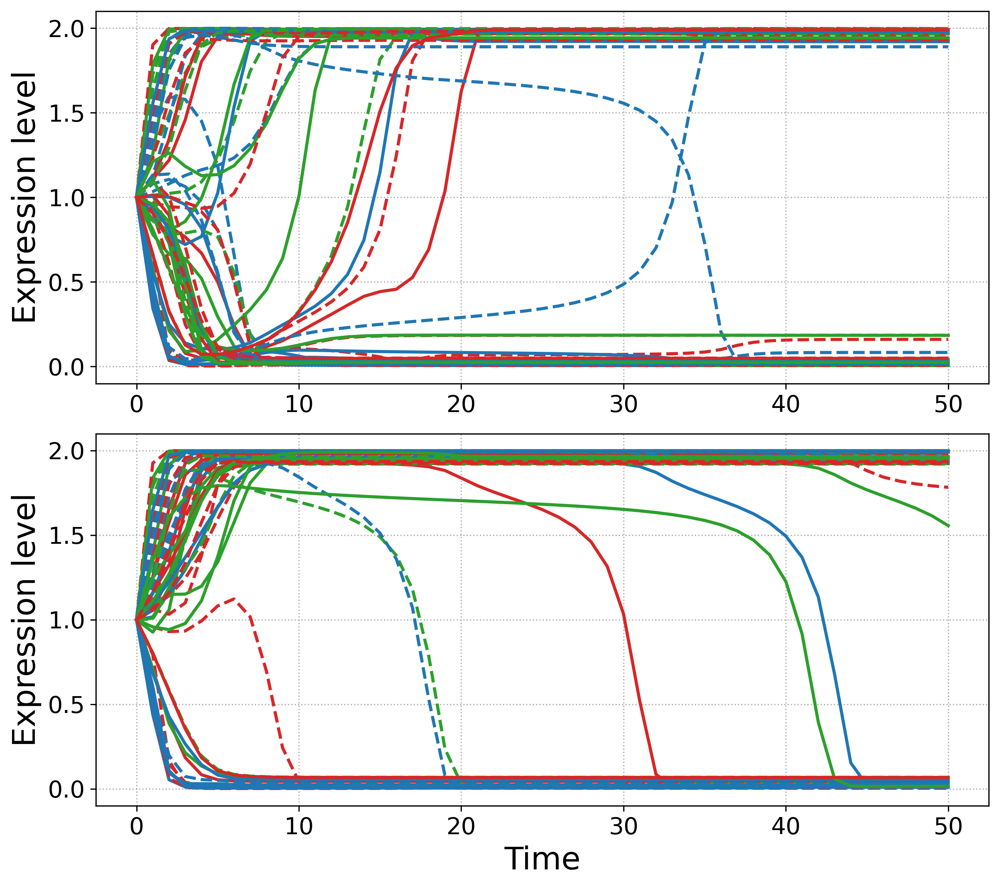

In [18]:
for rep in range(15):
    with open(exp_path + f'rep{rep:02}/best_gen_200000.evotsc', 'rb') as save_file:
        best_rep = pickle.load(save_file)
        plot_expr_AB(best_rep, '', f'{exp_path}/best_200k_rep{rep}.png')

In [19]:
def plot_fitness(full_stats):
    nb_rep = full_stats["Replicate"].nunique()
    
    colors = mpl.cm.get_cmap('viridis', nb_rep)(range(nb_rep))
    
    plt.figure(figsize=(9,4), dpi=300)
    
    plt.xscale('log')
    plt.yscale('log')
    plt.grid(linestyle=':')
    
    plt.xlabel('Generation', fontsize=label_fontsize)
    plt.ylabel('Fitness', fontsize=label_fontsize)
    
    plt.tick_params(axis='both', which='major', labelsize=tick_fontsize)
    
    for rep in range(nb_rep):
        stats_rep = full_stats[full_stats["Replicate"] == rep]
        stats_rep = stats_rep[stats_rep["Gen"] > 0]
        plt.plot(stats_rep["Fitness"],
                 linewidth=2,
                 color=colors[rep])
        
    print(np.log10(plt.ylim()))
        
    plt.savefig(f'{exp_path}/all_fitness', dpi=300, bbox_inches='tight')

[-98.31850831  -2.71952498]


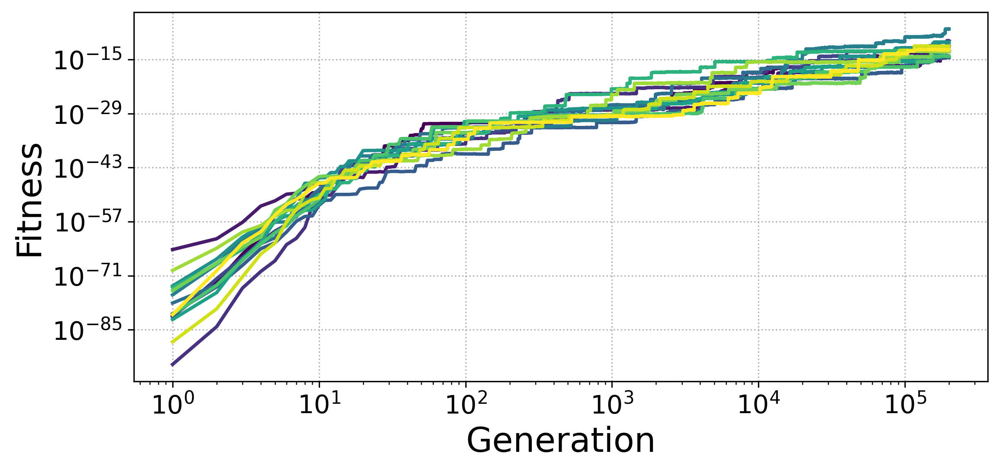

In [20]:
plot_fitness(full_stats)